In [1]:
import osmnx as ox

%matplotlib inline
ox.__version__

'1.3.0'

In [2]:
bbox = [40.4726064236, 40.6393520214, -104.9820008129, -105.1573565975]

G = ox.graph_from_bbox(
    *bbox,
    simplify=True,
    retain_all=True,
    clean_periphery=True,
    truncate_by_edge=True,
    network_type="drive_service",
)


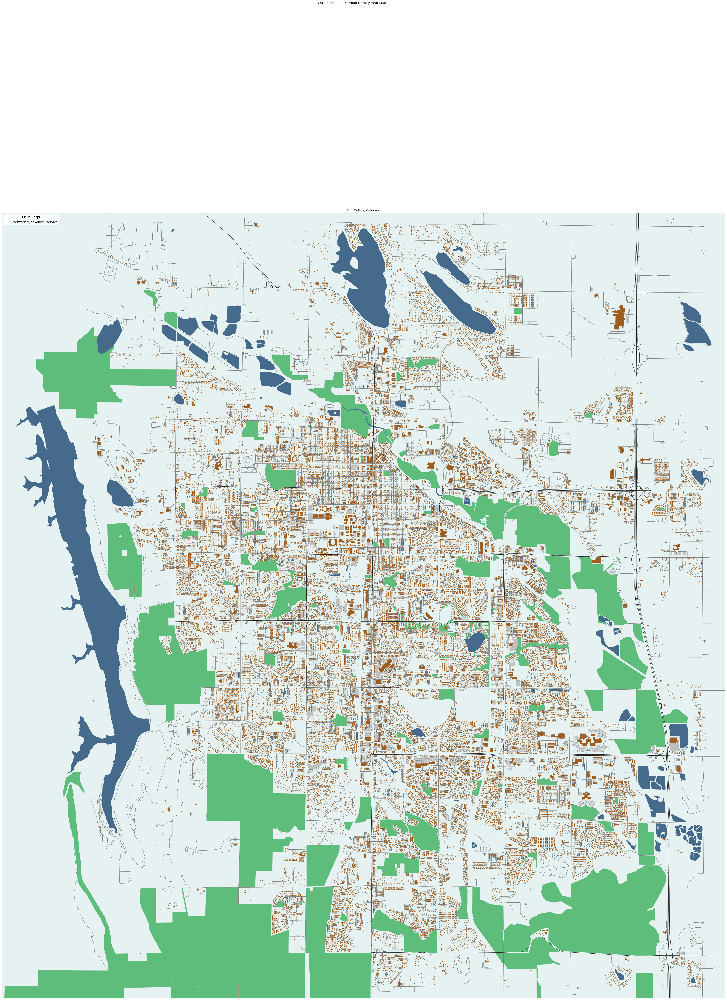

In [77]:
fig, ax = ox.plot_graph(
    G,
    bgcolor="#E6F2F2",
    show=False,
    close=False,
    node_size=0,
    edge_linewidth=1,
    edge_color="grey",
    figsize=(60, 80),
    dpi=200,
)

leisure = ox.geometries_from_bbox(*bbox, tags={"leisure": ["park", "nature_reserve", "common"]})
highway = ox.geometries_from_bbox(*bbox, tags={"highway": ["motorway", "motorway_link", "trunk", "trunk_link", "primary"]})
water = ox.geometries_from_bbox(*bbox, tags={"water": True})
parking = ox.geometries_from_bbox(*bbox, tags={"parking": ["surface", "street_side", "lane"], "amenity":["parking"]})
buildings = ox.geometries_from_bbox(*bbox, tags={"building": True})


margin = 0.02
west, south, east, north = water.unary_union.bounds
margin_ns = (north - south) * margin
margin_ew = (east - west) * margin
ax.set_ylim((south - margin_ns, north + margin_ns))
ax.set_xlim((west - margin_ew, east + margin_ew))
ax.set_title('Fort Collins, Colorado', fontsize='x-large', va='top')
fig.suptitle('CSU 2023 - CS495 Urban Density Heat Map', fontsize='x-large')


highway.plot(color="#1C1A17", linewidth=1, ax=ax, label='highway=[motorway, motorway_link, trunk, trunk_link, primary]')
water.plot(color="#466A8C", linewidth=1, ax=ax, label='water=True')
parking.plot(color="silver", linewidth=1, ax=ax, label='parking=[surface, street_side, lane], amenity=parking')
buildings.plot(color="#9E5D20", linewidth=1, ax=ax, label='building=True')
leisure.plot(color="#5EBD7B", linewidth=1, ax=ax, label='leisure=[park, nature_reserve, common]')
ax.legend(['network_type=drive_service'], loc='upper left', title='OSM Tags', fontsize="x-large", title_fontsize="xx-large")


